[Indice](index.ipynb) | Previo: [Mecanica.SistemasNoInerciales](05.03.00.00.Mecanica.SistemasNoInerciales.ipynb) | Siguiente: [Mecanica.ProblemasSeleccionados](05.03.00.00.Mecanica.ProblemasSeleccionados.ipynb)

### 5.5.5. Un ejemplo numérico
<a id='ejemplo_numerico_rotante'></a>

Para poner todo lo visto en las secciones anteriores a prueba, construyamos primero un sistema mecánico cuya solución podamos resolver numericamente y estudiar desde distintos sistemas de coordenadas.

Supongamos por ejemplo una partícula cuyo estado cinemático arbitrario en un momento inicial dado es $\vec r_0:(1,0,0)$ y $\vec v_0:(0,1,0)$ (en unidades arbitrarias).  

Supongamos también que la partícula esta sometida a una aceleración $\vec a(t,\vec r,\vec v)$ (campo de aceleración) que depende en general de la posición y la velocidad.  

Tomemos el caso de interés para nuestro libro, de una aceleración (en el sistema inercial) del tipo de aceleración gravitacional:

$$
\vec a = -k\frac{\vec r}{r^{n+1}}
$$
donde $k$ es una constante y $n$ un exponente arbitrario ($n=2$ para el caso de la aceleración de la gravedad).

Podemos construir una rutina que implementa este campo de aceleraciones (o modificarla para ver el efecto):

In [63]:
def a_inercial(t,r,v,parametros):
    from numpy.linalg import norm
    k=parametros["k"]
    n=parametros["n"]
    a=-k*r/norm(r)**(n+1)
    return a

Usando los métodos vistos en la [Sección *Integración numérical de la e.d.m.*](05.01.03.00.Mecanica.Cinematica.SolucionNumerica.ipynb#integracion_numerica_edm) podemos resolver la ecuación de movimiento en el sistema de referencia inercial.  Para ello debemos escribir primero la rutina que implementa la ecuación de movimiento linearizada (como vimos en el Figura ([fuerzas_ficticias](#fig:fuerzas_ficticias))([edm_ejemplo1](05.01.03.00.Mecanica.Cinematica.SolucionNumerica.ipynb#code:edm_ejemplo1))):

In [64]:
def edm_sistema_general(Y,t,aceleracion,parametros):
    from numpy import zeros
    dYdt=zeros(6)
    
    dYdt[:3]=Y[3:]
    dYdt[3:]=aceleracion(t,Y[:3],Y[3:],parametros)

    return dYdt

La solución numérica a la ecuación de movimiento se obtiene con este código:

In [66]:
#Condiciones iniciales
from numpy import array,concatenate
ro_ine=array([1.0,0.0,0.0])
vo_ine=array([0.0,0.5,0.0])
Yos=concatenate((ro_ine,vo_ine))

#Parametros
parametros=dict(k=1,n=2,omega0=0.3)

#Tiempos para la integración
from numpy import linspace
Nt=1000
ts=linspace(0,10,Nt)

#Solución numérica
from scipy.integrate import odeint
Ys=odeint(edm_sistema_general,Yos,ts,args=(a_inercial,parametros))

Un gráfico de la solución en el plano $x-y$ (del sistema inercial) sería:

In [67]:
%matplotlib nbagg

Traceback (most recent call last):
  File "/Users/jzuluaga/anaconda/lib/python3.6/site-packages/matplotlib/cbook/__init__.py", line 216, in process
    func(*args, **kwargs)
  File "/Users/jzuluaga/anaconda/lib/python3.6/site-packages/matplotlib/animation.py", line 1465, in _stop
    self.event_source.remove_callback(self._loop_delay)
AttributeError: 'NoneType' object has no attribute 'remove_callback'


<IPython.core.display.Javascript object>


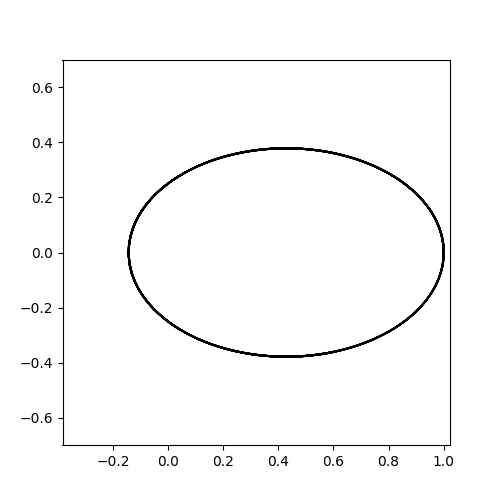

In [68]:
import matplotlib.pyplot as plt
fig=plt.figure(figsize=(5,5));
ax=fig.gca()
ax.plot(Ys[:,0],Ys[:,1],'k-');
from pymcel.plot import fija_ejes_proporcionales
fija_ejes_proporcionales(ax,Ys[:,:2],ycm=0);

<a id='fig:05.03.01.00.Mecanica.SistemasNoInerciales.Numerico_58'></a><center><b>Figura 5.58.</b> </center>

Convirtamos primero todas las componentes de los vectores posición y velocidad de la partícula al sistema de coordenadas rotante, aplicando para ello una matriz de rotación (a la manera como se definión en la [Sección *Rotación de cónicas en el plano*](04.02.02.00.Fundamentos.Conicas.Algebra.ipynb#conicas_rotacion_plano)) en un ángulo igual al que han rotado los ejes en el tiempo $t$, esto es $\theta=\omega_0 t$:

$$
R=
\left(
\begin{array}{ccc}
\cos(\omega_0 t) & \sin(\omega_0 t) & 0 \\
-\sin(\omega_0 t) & \cos(\omega_0 t) & 0 \\
0 & 0 & 1
\end{array}
\right)
$$

La aplicación de esta rotación a todas las posiciones y velocidades se puede realizar con este código:

In [69]:
#Velocidad angular
from numpy import array
omega0=parametros["omega0"]
omega_vec=array([0,0,omega0])

#Extraemos las posiciones del vector solución
rs_ine=Ys[:,:3]
vs_ine=Ys[:,3:]

#Aquí almacenaremos las posiciones en el sistema rotante
from numpy import zeros_like
rs_rot=zeros_like(rs_ine)

#Aquí realizamos las rotaciones
for i in range(Nt):
    
    #Matriz de rotación
    from spiceypy import rotate
    R=rotate(omega0*ts[i],3)
    
    #Rotación del vector posición y el vector velocidad
    from spiceypy import mxv
    rs_rot[i]=mxv(R,rs_ine[i])

Un gráfico de la posición en el sistema rotante se vería así:

<a id='code:plot_rotating_frame'></a>

<IPython.core.display.Javascript object>


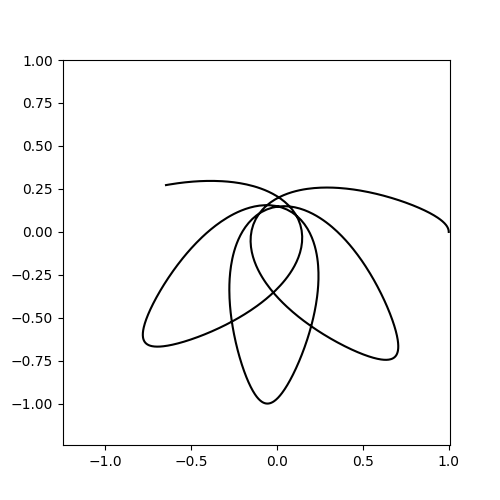

In [70]:
import matplotlib.pyplot as plt
fig=plt.figure(figsize=(5,5));
ax=fig.gca()
ax.plot(rs_rot[:,0],rs_rot[:,1],'k-');
from pymcel.plot import fija_ejes_proporcionales
fija_ejes_proporcionales(ax,rs_rot);

<a id='code:plot_rotating_frame'></a><center><b>Figura 5.59.</b> </center>

Como es de esperarse la precesión de la trayectoria en el sentido de las manecillas del reloj, es debida a que los ejes del sistema no inercial rotan en la dirección opuesta.  En el sistema de referencia no inercial, el movimiento en realidad es el producto de la acción de nuevas aceleraciones. 

Calculemos ahora otras cantidades cinemáticas en el movimiento de la partícula, tal y como son medida en el sistema de referencia rotante.  Por ejemplo la velocidad. Para ello usemos la definición misma de velocidad media, $\vec v'\approx\Delta \vec r'/\Delta t$:

In [71]:
vs_rot_num=zeros_like(rs_rot)
for i in range(1,Nt):
    vs_rot_num[i]=(rs_rot[i]-rs_rot[i-1])/(ts[i]-ts[i-1])

In [72]:
print(f"Velocidad en el sistema rotante (numérica):\n{vs_rot_num[10:100:10,:2]}")

Velocidad en el sistema rotante (numérica):
[[-0.07532063  0.20131871]
 [-0.15591406  0.20551357]
 [-0.23933049  0.21245658]
 [-0.32733931  0.22187998]
 [-0.42217525  0.23329757]
 [-0.52684744  0.24583631]
 [-0.64565776  0.25789048]
 [-0.78513966  0.26636666]
 [-0.95590195  0.26486744]]


Comparemos la velocidad calculada de esta manera y aquella que obtenemos con la relación teórica expresada por la Ec. ([adicion_velocidades_rotante](#mjx-eqn-eq%3Aadicion_velocidades_rotante)):

In [73]:
vs_rot_teo=zeros_like(rs_rot)
for i in range(1,Nt):
    from spiceypy import mxv,vcrss
    R=rotate(omega0*ts[i],3)
    vs_rot_teo[i]=mxv(R,vs_ine[i]-vcrss(omega_vec,rs_ine[i]))

In [74]:
print(f"Velocidad en el sistema rotante (teórica):\n{vs_rot_teo[10:100:10,:2]}")

Velocidad en el sistema rotante (teórica):
[[-0.07930671  0.20145953]
 [-0.16000322  0.20579598]
 [-0.24360361  0.21287079]
 [-0.33189483  0.222408  ]
 [-0.42714163  0.2339071 ]
 [-0.532403    0.2464687 ]
 [-0.65206479  0.25843607]
 [-0.79280874  0.26660831]
 [-0.96552359  0.26433721]]


Que coincide (dentro de los errores numéricos) con la velocidad calculada con el procedimiento aproximado.  Esta es pues, una manera de comprobar la validez de la Ec. ([adicion_velocidades_rotante](#mjx-eqn-eq%3Aadicion_velocidades_rotante)) y al mismo tiempo reconocer que su uso no es enteramente trivial.

Comparemos ahora las aceleraciones calculadas numéricamente y de acuerdo con lo esperado por la Ec. ([ley_adicion_aceleraciones](#mjx-eqn-eq%3Aley_adicion_aceleraciones)):

In [75]:
as_rot_num=zeros_like(rs_rot)
as_rot_teo=zeros_like(rs_rot)

for i in range(1,Nt):
    from spiceypy import mxv,vcrss
    R=rotate(omega0*ts[i],3)
    
    #Aceleración numérica
    as_rot_num[i]=(vs_rot_num[i]-vs_rot_num[i-1])/(ts[i]-ts[i-1])
    
    #Aceleración inercial (en el sistema inercial de referencia)
    a_ine=a_inercial(ts[i],rs_ine[i],vs_ine[i],parametros)
    
    #Aceleración centrífuga (en el sistema inercial de referencia)
    acen_ine=-vcrss(omega_vec,vcrss(omega_vec,rs_ine[i]))
    
    #Aceleración de Coriolis (en el sistema inercial de referencia)
    acor_ine=-2*vcrss(omega_vec,vs_ine[i])
    
    #Aceleración en el sistema rotante
    as_rot_teo[i]=mxv(R,a_ine+acen_ine+acor_ine)

In [76]:
print(f"Aceleracion en el sistema rotante (numérica):\n{as_rot_num[10:100:10,:2]}")
print(f"Aceleracion en el sistema rotante (teórica):\n{as_rot_teo[10:100:10,:2]}")

Aceleracion en el sistema rotante (numérica):
[[-0.79554295  0.02620614]
 [-0.81518587  0.05456669]
 [-0.85077482  0.0810844 ]
 [-0.90573158  0.10413843]
 [-0.98587707  0.12095637]
 [-1.10080298  0.12654252]
 [-1.26670165  0.11115688]
 [-1.5120825   0.05437954]
 [-1.89042734 -0.09097681]]
Aceleracion en el sistema rotante (teórica):
[[-0.61755554  0.03270565]
 [-0.64083707  0.06460197]
 [-0.68180406  0.09462909]
 [-0.7441443   0.12112619]
 [-0.83406685  0.14121815]
 [-0.96183018  0.14959271]
 [-1.14473989  0.13581134]
 [-1.41335515  0.07777086]
 [-1.82532413 -0.07627851]]


Con estos elementos a la mano, podemos ahora probar resolver las ecuaciones de movimiento de la partícula, pero en el sistema rotante, y comparar el resultado con el obtenido en la Figura ([code:plot_rotating_frame](#fig:code:plot_rotating_frame)).  Para ello lo único que tenemos que hacer es escribir una rutina que nos de las componentes del campo de aceleración $\vec a(\vec r,\vec v)$ pero en el sistema rotante:

In [77]:
def a_rotante(t,r,v,parametros):
    
    omega0=parametros["omega0"]
    
    from spiceypy import rotate,mxv,vcrss,invert
    R=rotate(omega0*t,3) 
    
    #Primero convierte r,v al sistema inercial
    r_ine=mxv(invert(R),r)
    v_ine=mxv(invert(R),v)
    
    #Calcula la aceleración en el sistema inercial
    ainercial=a_inercial(t,r_ine,v_ine,parametros)

    #Rota la aceleración inercial a los ejes rotantes
    ainercial_rot=mxv(R,ainercial)
    
    #Calcular la aceleración en el sistema rotante
    acen_rot=-vcrss(omega_vec,vcrss(omega_vec,r))
    acor_rot=-2*vcrss(omega_vec,v)
    a_rot=ainercial_rot+acen_rot+acor_rot
    return a_rot

La solución a la ecuación diferencial se consigue de forma analoga a cómo lo hicimos en el caso del sistema inercial:

<IPython.core.display.Javascript object>


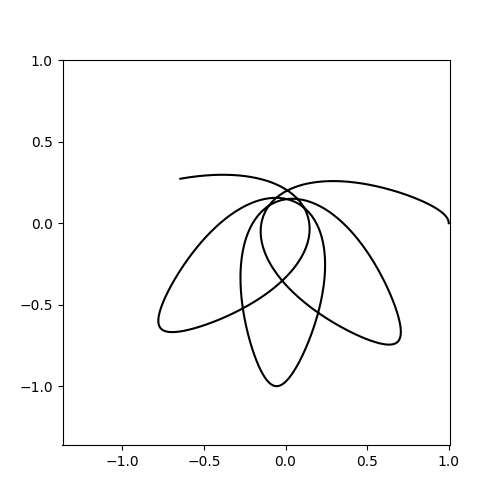

In [78]:
#Convertimos las condiciones iniciales, al sistema rotante
from spiceypy import rotate,mxv
ro_rot=ro_ine
R=rotate(0.0,3)
vo_rot=mxv(R,vo_ine-vcrss(omega_vec,ro_ine))

#Condiciones iniciales
from numpy import concatenate
Yos_rot=concatenate((ro_rot,vo_rot))

#Tiempos para la integración
from numpy import linspace
Nt=1000
ts=linspace(0,10,Nt)

#Solución numérica
from scipy.integrate import odeint
Ys_rot=odeint(edm_sistema_general,Yos_rot,ts,args=(a_rotante,parametros))

#Gráfico
import matplotlib.pyplot as plt
fig=plt.figure(figsize=(5,5));
ax=fig.gca()
ax.plot(Ys_rot[:,0],Ys_rot[:,1],'k-');
from pymcel.plot import fija_ejes_proporcionales
fija_ejes_proporcionales(ax,Ys_rot[:,:2]);

<a id='fig:05.03.01.00.Mecanica.SistemasNoInerciales.Numerico_60'></a><center><b>Figura 5.60.</b> </center>

Véamos ahora la dinámica del sistema en acción.  Utilice el código que se muestra a continuación, que incluye algunos de los resultados desarrollados en esta sección, y cambie al hacerlo el valor de los parámetros para ver el resultado.

<IPython.core.display.Javascript object>


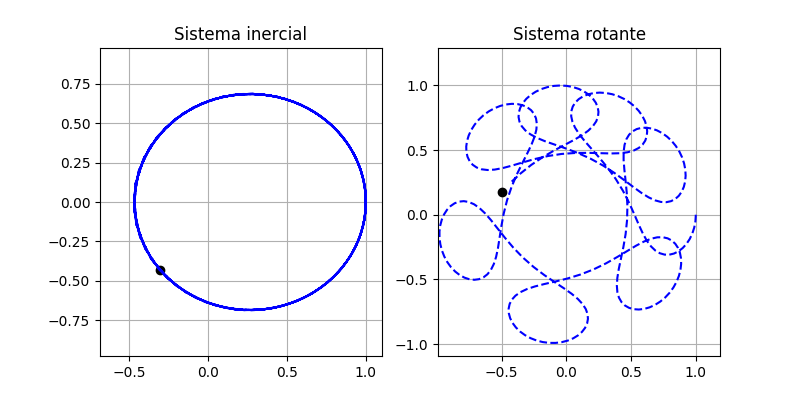

In [83]:
#Tiempos
Nt=300
ts=linspace(0,30,Nt)

#Parametros
parametros=dict(k=1,n=2,omega0=1.3)

#Sistema de referencia inercial
ro_ine=array([1.0,0.0,0.0])
vo_ine=array([0.0,0.8,0.0])
Yos=concatenate((ro_ine,vo_ine))
Ys=odeint(edm_sistema_general,Yos,ts,args=(a_inercial,parametros))

#Sistema de referencia rotante
ro_rot=ro_ine
R=rotate(0.0,3)
from numpy import array
omega_vec=array([0,0,parametros["omega0"]])
vo_rot=mxv(R,vo_ine-vcrss(omega_vec,ro_ine))
Yos_rot=concatenate((ro_rot,vo_rot))
Ys_rot=odeint(edm_sistema_general,Yos_rot,ts,args=(a_rotante,parametros))

#Gráfico básico
fig,axs=plt.subplots(1,2,figsize=(8,4))

inercial_punto,=axs[0].plot([],[],'ko');
inercial_linea,=axs[0].plot([],[],'b--');
axs[0].set_xlim((-1,1));
axs[0].set_ylim((-1,1));
axs[0].set_title("Sistema inercial")
axs[0].grid()

rotante_punto,=axs[1].plot([],[],'ko');
rotante_linea,=axs[1].plot([],[],'b--');
axs[1].set_xlim((-1,1));
axs[1].set_ylim((-1,1));
axs[1].set_title("Sistema rotante")
axs[1].grid()

from pymcel.plot import fija_ejes_proporcionales
fija_ejes_proporcionales(axs[0],Ys[:,:2],ycm=0);
fija_ejes_proporcionales(axs[1],Ys_rot[:,:2]);

def animacion(it):
    #Punto
    inercial_punto.set_data(Ys[it,0],Ys[it,1])
    rotante_punto.set_data(Ys_rot[it,0],Ys_rot[it,1])
    #Linea
    inercial_linea.set_data(Ys[:it,0],Ys[:it,1])
    rotante_linea.set_data(Ys_rot[:it,0],Ys_rot[:it,1])
    return inercial_punto,inercial_linea,rotante_punto,rotante_linea
 
from matplotlib import animation
anim=animation.FuncAnimation(fig,animacion,frames=Nt,interval=5,blit=True,repeat=False);

<a id='fig:05.03.01.00.Mecanica.SistemasNoInerciales.Numerico_61'></a><center><b>Figura 5.61.</b> </center>

Si desea tener más control sobre la animación puede visualizarla usando el siguiente comando:

In [62]:
from IPython.display import HTML
HTML(anim.to_jshtml())

[Indice](index.ipynb) | Previo: [Mecanica.SistemasNoInerciales](05.03.00.00.Mecanica.SistemasNoInerciales.ipynb) | Siguiente: [Mecanica.ProblemasSeleccionados](05.03.00.00.Mecanica.ProblemasSeleccionados.ipynb)